# Wetterbedingungen und weitere Einflüsse auf die Fahrradmobilität in Seattle

## Einleitung

Wie wir in der Bastelstrecke von [diy-iot2ds](https://github.com/birds-on-mars/diy-iot2ds) lernen können, ist es gar nicht sooo schwer und aufwendig, Wetterdaten automatisch zu erfassen. Allerdings ist die Analyse der isolierten Daten etwas ... gähn. Um spannendere Dinge zu tun und zu erkennen, muss man schon ein paar verschiedene Daten zusammenbringen.

Und auch das ist machbar! **Einen kleinen Teil des Ganzen muss/darf der geneigte Leser dabei selber machen.**
Google bietet eine kostenlose Umgebung dafür an. Falls noch nicht geschehen, jetzt **bitte einfach oben den Button "open in colab" anklicken** (und nach Studie der Bedingungen von Google diese ggf. akzeptieren, damit die Kiste läuft). 

Um dies zu veranschaulichen haben wir uns von Jake van der Plas, einem Astrophysiker, Data Science-Meister und Python-Guru inspirieren lassen. Jake hält nicht nur viele Talks zum Thema und hat hervorragende Bücher wie das [Data Science Handbook](https://jakevdp.github.io/PythonDataScienceHandbook/) geschrieben, das es übrigens komplett open-source und interaktiv durch- und zu bearbeiten gibt. Er schreibt auch seit längerem einen Blog, in dem er auch immer wieder Methoden anschaulich beschreibt.  

In 2014 hat er dort die Frage gestellt, ob es einen Aufschwung in der Nutzung von Fahrrädern in Seattle gibt. Hier der [Link zum Blog von dunnemals](https://jakevdp.github.io/blog/2014/06/10/is-seattle-really-seeing-an-uptick-in-cycling/).  

**Hier werden öffentlich zugängliche und recht volatile Daten zum (automatisch erfassten) Fahrrad-Verkehr über die Fremont-Brücke in Seatlle mit Wetter- und auch berechneten Daten in Verbindung gebracht, um zu verifizieren, ob es tatsächlich eine Veränderung der Fahrrad-Fahrten im Laufe der Zeit gibt bzw. welchen Einfluss andere Umgebungsdaten haben.** 

Die Antwort von Jake van der Plas in seinem Blog damals war: ja, es gibt einen Zuwachs an Fahrradverkehr.
Jetzt sind wir ein paar Jahre weiter und wir fragen uns daher: ist das immer noch der Fall?  

Let's see...

## Verwendete Datenquellen

Auf den Fahrradwegen der Fremont-Brücke in Seattle werden mit magnetischen Induktionsschleifen automatisch Fahrräder gezählt. Da [Open-Data](https://de.wikipedia.org/wiki/Open_Data) in den USA auch bei öffentlichen Institutionen recht verbreitet ist, sind diese Daten frei zugänglich. Sie werden [auf dem Open-Data-Portal der Stadt Seattle bereitgestellt](https://data.seattle.gov/Transportation/Fremont-Bridge-Hourly-Bicycle-Counts-by-Month-Octo/65db-xm6k). Die hier im Repository hinterlegten Daten sind vom 04. Juni 2019 und reichen zurück bis 2012.  

So sieht übrigens die Fremont-Brücke in Seattle aus:

![Fremont-Brücke in Seatlle](https://upload.wikimedia.org/wikipedia/commons/8/88/FremontBridgePano.jpg)  

Auch Wetterdaten aus den USA sind frei zugänglich über das [National Center of Environmental Information](://www.ncdc.noaa.gov/cdo-web/search?datasetid=GHCND), wo u.a. die Wetterstation des SeaTac Airport in Seattle ausgewählt werden kann (ID der Wetterstation "USW00024233"). Hier haben wir uns die letzten verfügbaren Daten vom 25. Juni 2019 (auch zurück bis 2012) besorgt.

## Vorgehen

Auch hier werden wir die üblichen Schritte einer Data Science-Analyse durchlaufen:
- **Laden und erstes Explorieren der Daten** (*Gathering*) verbunden mit einer ersten ganz kurzen ersten Exploration, wie die Daten in der Rohversion aussehen.
- **Strukturieren der Daten** (*Preprocessing*) um die Daten in eine gesamthaft weiterverarbeitbare Form zu bringen.
- **Bereinigung und weitere Exploration der Daten** *(Cleansing, Exploration)*, um die Daten in die finale Form für die Modellbildung zu bringen. Glücklicherweise sind die Daten recht "sauber", was den ansonsten oft sehr mühseligen Teil der Bereinigung sehr kurz macht. Wir werden die Daten aber recht ausgiebig visualisieren.
- Last, but not least **Modellierung der Daten** *(Modelling)*. Hier benutzen wir werden wir eine "einfache" multi-lineare Regression anwenden, um zu prüfen, welcher Einflussfaktor wie (linear) wirkt und welcher Trend sich am Ende für den zeitlichen Verlauf der Fahrrad-Nutzung ergibt. 

## Verwendete Programmbibliotheken

Die Analyse der Daten nehmen wir in der Programmiersprache Python vor, die für sehr vieles geeignet ist, aber auch sehr beliebt für Data Science, Machine Learning und AI ist.

Sie ist nicht nur deshalb in diesen Gebieten so beliebt, weil sie relativ leicht zu lernen und sehr vielseitig ist, sondern auch und insbesondere, weil es viele schlaue Geister in Python sehr coole Programm-Bibliotheken geschrieben haben, die open source bereitstehen, sofort verwendet werden können und einem viel Arbeit abnehmen.

Wir laden uns die folgenden Bibliotheken:

In [70]:
# Importieren von Programm-Bibliotheken

# Programm-Bibliothek zur effizienten Bearbeitung von Datentabellen
import pandas as pd

# Programm-Bibliothek zur schnellen Bearbeitung numerischer Tabellendaten
import numpy as np

# Programm-Bibliothek zu grafischen Darstellung von Daten
import altair as alt
alt.renderers.enable('notebook')

# Programm für Lineare Regression
from sklearn.linear_model import LinearRegression

## Laden und erstes Explorieren der Daten *(Gathering, First Exploration)*

### Laden und erstes Explorieren der Verkehrsdaten

In [2]:
# Laden der 'Verkehrsdaten' 
# aus Datei'Fremont_Bridge_Hourly_Bicycle_Counts_by_Month_October_2012_to_present.csv' 
# im Ordner 'Daten'
Verkehrsdaten = pd.read_csv(
    'Daten/Fremont_Bridge_Hourly_Bicycle_Counts_by_Month_October_2012_to_present.csv')

In [3]:
# Lesen der obersten Reihe der 'Verkehrsdaten'
Verkehrsdaten.head()

,Date,Fremont Bridge East Sidewalk,Fremont Bridge West Sidewalk
0,05/31/2019 11:00:00 PM,22.0,35.0
1,05/31/2019 10:00:00 PM,29.0,52.0
2,05/31/2019 09:00:00 PM,46.0,57.0
3,05/31/2019 08:00:00 PM,48.0,92.0
4,05/31/2019 07:00:00 PM,97.0,151.0


In [4]:
# Lesen der untersten Reihen der 'Verkehrsdaten'
Verkehrsdaten.tail()

,Date,Fremont Bridge East Sidewalk,Fremont Bridge West Sidewalk
58363,10/03/2012 04:00:00 AM,6.0,1.0
58364,10/03/2012 03:00:00 AM,2.0,3.0
58365,10/03/2012 02:00:00 AM,1.0,1.0
58366,10/03/2012 01:00:00 AM,4.0,6.0
58367,10/03/2012 12:00:00 AM,4.0,9.0


In [5]:
# Abstrakte Information über die 'Verkehrsdaten'
Verkehrsdaten.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58368 entries, 0 to 58367
Data columns (total 3 columns):
Date                            58368 non-null object
Fremont Bridge East Sidewalk    58359 non-null float64
Fremont Bridge West Sidewalk    58359 non-null float64
dtypes: float64(2), object(1)
memory usage: 1.3+ MB


In [6]:
# Grundlegende Statistik der 'Verkehrsdaten'
Verkehrsdaten.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Date,58368,58368,01/08/2018 10:00:00 PM,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fremont Bridge East Sidewalk,58359,NaN,NaN,NaN,52.1382,67.5161,0,6,28,70,698
Fremont Bridge West Sidewalk,58359,NaN,NaN,NaN,58.9453,85.8879,0,7,29,71,745


### *Do-It-Yourself: Laden und erstes Explorieren der Wetterdaten*

In [7]:
# Lesen der 'Wetterdaten' 
# aus Datei '178440.csv' 
# im Ordner 'Daten' 
Wetterdaten = pd.read_csv('Daten/1786440.csv')

In [8]:
# Lesen der obersten Reihe der 'Wetterdaten'
Wetterdaten.head()

,STATION,NAME,DATE,AWND,PGTM,PRCP,SNOW,SNWD,TAVG,TMAX,...,WT03,WT04,WT05,WT08,WT09,WT13,WT14,WT16,WT18,WT22
0,USW00024233,"SEATTLE TACOMA INTERNATIONAL AIRPORT, WA US",2012-10-03,7.3,NaN,0.0,0.0,0.0,NaN,18.9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,USW00024233,"SEATTLE TACOMA INTERNATIONAL AIRPORT, WA US",2012-10-04,6.5,NaN,0.0,0.0,0.0,NaN,18.9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,USW00024233,"SEATTLE TACOMA INTERNATIONAL AIRPORT, WA US",2012-10-05,5.7,NaN,0.0,0.0,0.0,NaN,21.7,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,USW00024233,"SEATTLE TACOMA INTERNATIONAL AIRPORT, WA US",2012-10-06,5.1,NaN,0.0,0.0,0.0,NaN,23.9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,USW00024233,"SEATTLE TACOMA INTERNATIONAL AIRPORT, WA US",2012-10-07,1.3,NaN,0.0,0.0,0.0,NaN,23.9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
# Lesen der untersten Reihe der 'Wetterdaten'
Wetterdaten.tail()

,STATION,NAME,DATE,AWND,PGTM,PRCP,SNOW,SNWD,TAVG,TMAX,...,WT03,WT04,WT05,WT08,WT09,WT13,WT14,WT16,WT18,WT22
2431,USW00024233,"SEATTLE TACOMA INTERNATIONAL AIRPORT, WA US",2019-05-31,2.2,NaN,0.0,0.0,0.0,17.1,24.4,...,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
2432,USW00024233,"SEATTLE TACOMA INTERNATIONAL AIRPORT, WA US",2019-06-01,2.7,NaN,0.0,0.0,0.0,16.4,24.4,...,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
2433,USW00024233,"SEATTLE TACOMA INTERNATIONAL AIRPORT, WA US",2019-06-02,3.1,NaN,0.0,0.0,0.0,17.5,23.9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2434,USW00024233,"SEATTLE TACOMA INTERNATIONAL AIRPORT, WA US",2019-06-03,3.3,NaN,0.0,0.0,0.0,15.6,20.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2435,USW00024233,"SEATTLE TACOMA INTERNATIONAL AIRPORT, WA US",2019-06-04,2.4,NaN,0.0,0.0,0.0,15.8,22.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
# Abstrakte Information über die 'Wetterdaten'
Wetterdaten.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2436 entries, 0 to 2435
Data columns (total 27 columns):
STATION    2436 non-null object
NAME       2436 non-null object
DATE       2436 non-null object
AWND       2435 non-null float64
PGTM       52 non-null float64
PRCP       2435 non-null float64
SNOW       2435 non-null float64
SNWD       2435 non-null float64
TAVG       2256 non-null float64
TMAX       2435 non-null float64
TMIN       2435 non-null float64
WDF2       2435 non-null float64
WDF5       2415 non-null float64
WSF2       2435 non-null float64
WSF5       2415 non-null float64
WT01       1050 non-null float64
WT02       123 non-null float64
WT03       17 non-null float64
WT04       2 non-null float64
WT05       3 non-null float64
WT08       83 non-null float64
WT09       1 non-null float64
WT13       104 non-null float64
WT14       19 non-null float64
WT16       129 non-null float64
WT18       6 non-null float64
WT22       9 non-null float64
dtypes: float64(24), object(3)


In [11]:
# Grundlegende Statistik der 'Wetterdaten'
Wetterdaten.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
STATION,2436,1,USW00024233,2436,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NAME,2436,1,"SEATTLE TACOMA INTERNATIONAL AIRPORT, WA US",2436,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DATE,2436,2436,2014-12-08,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AWND,2435,NaN,NaN,NaN,3.40234,1.38279,0.4,2.4,3.2,4.3,9.5
PGTM,52,NaN,NaN,NaN,1413.48,728.946,2,1030.75,1440.5,1996.25,2357
PRCP,2435,NaN,NaN,NaN,3.03257,6.66503,0,0,0,3,55.9
SNOW,2435,NaN,NaN,NaN,0.434086,6.34253,0,0,0,0,163
SNWD,2435,NaN,NaN,NaN,0.708419,8.77461,0,0,0,0,180
TAVG,2256,NaN,NaN,NaN,12.2891,5.91813,-4.4,8,11.9,16.9,27.6
TMAX,2435,NaN,NaN,NaN,16.3255,7.40495,-1.6,10.6,15.6,21.7,35.6


## Strukturieren der Daten *(Preprocessing)*

In [12]:
# Anlegen einer neuen Datenstruktur 'Daten'
Daten = pd.DataFrame()

### Formattieren und Aggregieren und Hinzufügen der Verkehrsdaten

Zunächst formatieren wir die Spalte 'Date' von 'verkehrsdaten' in ein Format um, dass von 'pandas' als Zeiten interpretiert werden kann.

In [13]:
# Konvertieren der Spalte 'Date' in 'Verkehrsdaten'
# in ein "echtes" Datumsformat
Verkehrsdaten['Date'] = pd.to_datetime(Verkehrsdaten['Date'])

Dann setzen wir den Index der Tabelle 'verkehrsdaten' auf 'date'

In [14]:
# Ersetzen der Index-Spalte mit der Spalte 'Date' aus 'Verkehrsdaten'
Verkehrsdaten = Verkehrsdaten.set_index('Date')

Um Vergleichbarkeit zu den Wetterdaten zu erreichen, aggregieren wir 

In [15]:
# Aggregieren und Ersetzen der stündlichen 'Verkehrsdaten' 
# durch tägliche 'Verkehrsdaten'
Verkehrsdaten = Verkehrsdaten.resample('d').sum()

In [16]:
# Lesen von Beispielreihen der 'Verkehrsdaten'
Verkehrsdaten.sample(5)

,Fremont Bridge East Sidewalk,Fremont Bridge West Sidewalk
Date,,
2015-12-26,250.0,238.0
2014-09-01,1256.0,1100.0
2018-01-28,349.0,329.0
2018-12-10,1070.0,1763.0
2013-06-09,1183.0,898.0


In [17]:
# Abstrakte Information über 'Verkehrsdaten'
Verkehrsdaten.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2432 entries, 2012-10-03 to 2019-05-31
Freq: D
Data columns (total 2 columns):
Fremont Bridge East Sidewalk    2432 non-null float64
Fremont Bridge West Sidewalk    2432 non-null float64
dtypes: float64(2)
memory usage: 57.0 KB


In [18]:
# Grundlegende Statistik der 'Verkehrsdaten'
Verkehrsdaten.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
Fremont Bridge East Sidewalk,2432.0,1251.123355,604.790258,19.0,817.0,1191.0,1695.00,3143.0
Fremont Bridge West Sidewalk,2432.0,1414.469161,758.560427,12.0,869.0,1294.0,1993.25,3752.0


In [19]:
# Übertragen der Summe der Spalten aus den 'Verkehrsdaten'
# in eine (neue) Spalte 'Fahrten' der 'Daten'
Daten['Fahrten'] = Verkehrsdaten['Fremont Bridge East Sidewalk'] + Verkehrsdaten['Fremont Bridge West Sidewalk']

In [20]:
# Benennung des Index der 'Daten' mit 'Datum'
Daten.index = pd.DatetimeIndex(data=Verkehrsdaten.index, name='Datum')

In [21]:
# Lesen von Beispielreihen aus den 'Daten'
Daten.sample(5)

,Fahrten
Datum,
2017-03-02,2198.0
2018-03-04,777.0
2013-03-27,2617.0
2017-10-12,2712.0
2013-06-01,2240.0


### Ermitteln und Hinzufügen berechneter Daten (Tageslänge und Wochentag)

In [22]:
# Anlegen einer neuen Datenstruktur 'Berechnete_Daten'
# mit Übernahme der Index-Struktur von 'Daten'
Berechnete_Daten = pd.DataFrame(index=Daten.index)

In [23]:
# Neue Spalte 'Tag' in 'Berechnete_Daten'
# aus den Zahlenwerten des 'index' (der das Datum enthalt)
Berechnete_Daten['Tag'] = pd.to_numeric(Berechnete_Daten.index)

In [24]:
# Lesen von Beispielsreihen aus 'Berechnete Daten'
Berechnete_Daten['Tag'].sample(5)

Datum
2014-05-07    1399420800000000000
2014-06-18    1403049600000000000
2017-07-25    1500940800000000000
2015-10-05    1444003200000000000
2016-11-28    1480291200000000000
Name: Tag, dtype: int64

In [25]:
# Umwandeln der Spalte 'Tag' in ganzzahlige Werte
# die einzelnen Tagen entsprechen
Tageslaenge_in_Nanosekunden = 24*60*60*1_000_000_000
Berechnete_Daten['Tag'] = (Berechnete_Daten['Tag'] - Berechnete_Daten['Tag'].min()) \
                        / Tageslaenge_in_Nanosekunden

In [26]:
# Lesen der ersten Reihen von 'Berechnete Daten'
Berechnete_Daten.head(5)

,Tag
Datum,
2012-10-03,0.0
2012-10-04,1.0
2012-10-05,2.0
2012-10-06,3.0
2012-10-07,4.0


In [27]:
# Formel zur Berechnung der Tageslänge in Abhängigkeit des
# Datums und des Laengengrades 
# (voreingestellt ist der Längengrad von Seattle)

def Berechne_Tageslaenge(Datum, Laengengrad=47.61):
    
    # Neigung der Erdachse in Grad
    Neigung_erdachse = 23.44
    
    # Wintersonnenwende
    Wintersonnenwende = pd.datetime(2000, 12, 21)
    
    # Tage seit Wintersonnenwende (WSW)
    Zeit_seit_WSW = Datum - Wintersonnenwende
    Tage_seit_WSW = Zeit_seit_WSW.total_seconds() / (24. * 60. * 60.)
    Tage_seit_WSW = Tage_seit_WSW % 365.25
    
    m = 1. - \
        np.tan(np.radians(Laengengrad)) * \
        np.tan(
            np.radians(Neigung_erdachse) * 
            np.cos(Tage_seit_WSW * np.pi / 182.625) 
    )
    
    m = max(0, min(m, 2))
    
    Tageslaenge = 24. * np.degrees(np.arccos(1 - m)) / 180.
    
    return Tageslaenge

In [28]:
# Aufbau einer Liste von Tageslaengen und 
# Übernahme in eine neue Spalte 'Tageslaenge'
# in 'Berechnete_Daten'
Tageslaengen = list(map(Berechne_Tageslaenge, Berechnete_Daten.index))
Berechnete_Daten['Tageslaenge'] = Tageslaengen

In [29]:
# Lesen von Beispielreihen aus 'Berechnete Daten'
Berechnete_Daten.sample(5)

,Tag,Tageslaenge
Datum,,
2016-02-07,1222.0,9.539842
2015-09-13,1075.0,12.496145
2017-11-25,1879.0,8.667503
2017-04-11,1651.0,13.148917
2016-04-01,1276.0,12.583973


In [30]:
# Berechnung, ob ein Tag ein Werktag 
# ist (1) oder nicht (0) und
# Übernahme in eine neue Spalte 'ist_Werktag' von 'Berechnete_Daten'
Berechnete_Daten['ist_Werktag'] = 1 - Berechnete_Daten.index.dayofweek // 5

In [31]:
# Lesen von Beispielreihen aus 'Berechnete Daten'
Berechnete_Daten.sample(5)

,Tag,Tageslaenge,ist_Werktag
Datum,,,
2013-07-14,284.0,15.450903,0
2015-12-10,1163.0,8.312353,1
2019-01-04,2284.0,8.341865,1
2015-10-30,1122.0,9.816286,1
2014-08-07,673.0,14.514769,1


In [32]:
# Übernahme von 'Tageslaenge' und 'ist_Werktag'
# aus 'Berechnete_Daten' in die 'Daten'
Daten[['Tag', 'Tageslaenge', 'ist_Werktag']] = Berechnete_Daten[['Tag', 'Tageslaenge', 'ist_Werktag']]

In [33]:
# Lesen von Beispielreihen aus 'Daten'
Daten.sample(5)

,Fahrten,Tag,Tageslaenge,ist_Werktag
Datum,,,,
2019-05-04,2672.0,2404.0,14.367614,0
2016-02-14,606.0,1229.0,9.894138,0
2014-09-09,3988.0,706.0,12.715356,1
2013-07-04,3749.0,274.0,15.677555,1
2018-04-22,2085.0,2027.0,13.751527,0


### *Do-It-Yourself: Formatieren und Hinzufügen ausgewählter Wetterdaten*

In [34]:
# Konvertieren der Spalte 'DATE' in 'Wetterdaten'
# in ein "echtes" Datumsformat
# (vgl. 'Formattieren und Aggregieren und Hinzufügen der Verkehrsdaten')
Wetterdaten['DATE'] = pd.to_datetime(Wetterdaten['DATE'])

In [35]:
# Ersetzen der Index-Spalte mit der Spalte 'DATE' aus 'Wetterdaten'
# (vgl. 'Formattieren und Aggregieren und Hinzufügen der Verkehrsdaten')
Wetterdaten = Wetterdaten.set_index('DATE')

In [36]:
# Abstrakte Information über 'Wetterdaten'
# (vgl. 'Formattieren und Aggregieren und Hinzufügen der Verkehrsdaten')
Wetterdaten.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2436 entries, 2012-10-03 to 2019-06-04
Data columns (total 26 columns):
STATION    2436 non-null object
NAME       2436 non-null object
AWND       2435 non-null float64
PGTM       52 non-null float64
PRCP       2435 non-null float64
SNOW       2435 non-null float64
SNWD       2435 non-null float64
TAVG       2256 non-null float64
TMAX       2435 non-null float64
TMIN       2435 non-null float64
WDF2       2435 non-null float64
WDF5       2415 non-null float64
WSF2       2435 non-null float64
WSF5       2415 non-null float64
WT01       1050 non-null float64
WT02       123 non-null float64
WT03       17 non-null float64
WT04       2 non-null float64
WT05       3 non-null float64
WT08       83 non-null float64
WT09       1 non-null float64
WT13       104 non-null float64
WT14       19 non-null float64
WT16       129 non-null float64
WT18       6 non-null float64
WT22       9 non-null float64
dtypes: float64(24), object(2)
memory usage: 

In [37]:
# Grundlegende Statistik der 'Wetterdaten'
# (vgl. 'Formattieren und Aggregieren und Hinzufügen der Verkehrsdaten')
Wetterdaten.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
STATION,2436,1,USW00024233,2436,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NAME,2436,1,"SEATTLE TACOMA INTERNATIONAL AIRPORT, WA US",2436,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AWND,2435,NaN,NaN,NaN,3.40234,1.38279,0.4,2.4,3.2,4.3,9.5
PGTM,52,NaN,NaN,NaN,1413.48,728.946,2,1030.75,1440.5,1996.25,2357
PRCP,2435,NaN,NaN,NaN,3.03257,6.66503,0,0,0,3,55.9
SNOW,2435,NaN,NaN,NaN,0.434086,6.34253,0,0,0,0,163
SNWD,2435,NaN,NaN,NaN,0.708419,8.77461,0,0,0,0,180
TAVG,2256,NaN,NaN,NaN,12.2891,5.91813,-4.4,8,11.9,16.9,27.6
TMAX,2435,NaN,NaN,NaN,16.3255,7.40495,-1.6,10.6,15.6,21.7,35.6
TMIN,2435,NaN,NaN,NaN,8.1037,5.00329,-7.1,4.4,8.3,12.2,20.6


In [38]:
# Übernahme der Spalten 'TAVG' (average temperature = durchschnittliche Temperatur)
# und 'PRCP' (precipitation = Niederschlag) in 
# neue Spalten von 'Daten' 'Temperatur' und 'Niederschlag'
# (vgl. 'Formattieren und Aggregieren und Hinzufügen der Verkehrsdaten')
Daten['Temperatur'] = Wetterdaten['TAVG']
Daten['Niederschlag'] = Wetterdaten['PRCP']

In [39]:
# Lesen von Beispielreihen aus 'Daten'
# (vgl. 'Formattieren und Aggregieren und Hinzufügen der Verkehrsdaten')
Daten.sample(5)

,Fahrten,Tag,Tageslaenge,ist_Werktag,Temperatur,Niederschlag
Datum,,,,,,
2014-03-11,3416.0,524.0,11.321091,1,8.2,0.0
2018-12-31,1059.0,2280.0,8.280203,1,4.1,0.0
2015-09-15,3657.0,1077.0,12.378801,1,13.4,0.0
2018-12-20,1495.0,2269.0,8.220433,1,10.7,6.9
2014-11-10,3254.0,768.0,9.268611,1,9.0,0.0


## Bereinigung und weitere Exploration der Daten *(Cleansing, Exploration)*

In [40]:
# Kopieren von 'Daten' in eine
# neue Datentabelle 'DatenQuelle'
# um die Daten vor weiterer Veränderung zu schützen
DatenQuelle = Daten.copy()
DatenQuelle.sample()

,Fahrten,Tag,Tageslaenge,ist_Werktag,Temperatur,Niederschlag
Datum,,,,,,
2016-01-30,1027.0,1214.0,9.168254,0,5.6,1.3


In [41]:
# Neue Spalte 'Datum' aus dem 
# Index von DatenQuelle (und
# Erzeugen eines neuen, generischen Indexes)
DatenQuelle.reset_index(drop=False, inplace=True)

In [42]:
# Lesen von Beispielreihen von 'DatenQuelle'
DatenQuelle.sample(5)

,Datum,Fahrten,Tag,Tageslaenge,ist_Werktag,Temperatur,Niederschlag
2122,2018-07-26,5140.0,2122.0,15.046390,1,25.1,0.0
194,2013-04-15,2687.0,194.0,13.376328,1,7.9,0.0
644,2014-07-09,5135.0,644.0,15.584815,1,21.2,0.0
10,2012-10-13,766.0,10.0,10.701479,0,NaN,4.8
1336,2016-05-31,4899.0,1336.0,15.478833,1,18.2,0.0


In [43]:
# Reorganisation der Spaltenreihenfolge
DatenQuelle = DatenQuelle[['Datum', 'Tag', 'Fahrten', 'Tageslaenge', 'ist_Werktag', 'Temperatur', 'Niederschlag']]

In [44]:
# Grundlegende Statistik von 'DatenQuelle'
DatenQuelle.describe(include='all').T

,count,unique,top,freq,first,last,mean,std,min,25%,50%,75%,max
Datum,2432,2432,2016-11-14 00:00:00,1,2012-10-03 00:00:00,2019-05-31 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Tag,2432,NaN,NaN,NaN,NaN,NaN,1215.5,702.202,0,607.75,1215.5,1823.25,2431
Fahrten,2432,NaN,NaN,NaN,NaN,NaN,2665.59,1320.02,38,1750,2499.5,3697.25,6183
Tageslaenge,2432,NaN,NaN,NaN,NaN,NaN,11.8816,2.59869,8.21889,9.36066,11.7755,14.4049,15.7811
ist_Werktag,2432,NaN,NaN,NaN,NaN,NaN,0.714638,0.451679,0,0,1,1,1
Temperatur,2252,NaN,NaN,NaN,NaN,NaN,12.2819,5.92085,-4.4,7.975,11.9,16.9,27.6
Niederschlag,2431,NaN,NaN,NaN,NaN,NaN,3.03756,6.66938,0,0,0,3,55.9


In [45]:
# Löschen aller Reihen die 
# keine Werte in einer oder mehreren Spalten enthalten
DatenQuelle.dropna(inplace=True)

In [46]:
# Grundlegende Statistik von 'DatenQuelle'
DatenQuelle.describe(include='all').T

,count,unique,top,freq,first,last,mean,std,min,25%,50%,75%,max
Datum,2251,2251,2016-11-14 00:00:00,1,2013-04-01 00:00:00,2019-05-31 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Tag,2251,NaN,NaN,NaN,NaN,NaN,1305.01,649.964,180,742.5,1305,1867.5,2431
Fahrten,2251,NaN,NaN,NaN,NaN,NaN,2738.65,1326.85,38,1806,2598,3811.5,6183
Tageslaenge,2251,NaN,NaN,NaN,NaN,NaN,12.0567,2.59881,8.21889,9.52156,12.1435,14.5627,15.7811
ist_Werktag,2251,NaN,NaN,NaN,NaN,NaN,0.714793,0.451613,0,0,1,1,1
Temperatur,2251,NaN,NaN,NaN,NaN,NaN,12.2811,5.92203,-4.4,7.95,11.9,16.9,27.6
Niederschlag,2251,NaN,NaN,NaN,NaN,NaN,2.93816,6.57252,0,0,0,2.5,55.9


In [47]:
# Funktion zur Erzeugung
# einer Grafik für eine Variable
# im zeitlichen Verlauf
def Grafik_Verlauf(Abhaengige_Variable='Fahrten', 
                   DatenQuelle=DatenQuelle, 
                   # Variablen für die optionale 
                   # weitere Variation der Grafiken
                   # (wird später benutzt)
                   Glaettungsfenster=None, 
                   Auswahlfilter=None):
    
    if Glaettungsfenster:
        
        Grafik_Verlauf = alt.Chart(
            data=DatenQuelle,
            width=600, height=300
        ).mark_line(
            color='orange', size=2
        ).transform_window(
            Gelaettete_Variable='mean('+ Abhaengige_Variable + ')',
            frame=[0, Glaettungsfenster]
        ).encode(
            x=alt.X('Datum:T',
                    axis=alt.Axis(title=None)),
            y=alt.Y('Gelaettete_Variable:Q',
                    axis=alt.Axis(title=None)
                   )
        ).properties(
            title='Zeitlicher Verlauf von ' + Abhaengige_Variable + \
            ' (inkl. ' + str(Glaettungsfenster) + '-Tage-Glaettung)'
        )
        
    else:
        
        Grafik_Verlauf = alt.Chart(
            data=DatenQuelle,
            width=600, height=300
        ).mark_point(
            size=2
        ).encode(
            x=alt.X('Datum',
                    axis=alt.Axis(title=None)),
            y=alt.Y(Abhaengige_Variable,
                    axis=alt.Axis(title=None)),
            tooltip=list(DatenQuelle.columns)
        ).properties(
            title='Zeitlicher Verlauf von ' + Abhaengige_Variable
        )
        
        if Auswahlfilter:
            
            Grafik_Verlauf = Grafik_Verlauf.encode(
                color=alt.condition(Auswahlfilter,
                                    alt.ColorValue('#1f77b4'), 
                                    alt.ColorValue('lightgrey'))
            ).add_selection(Auswahlfilter)
            
        Trendvariable = 'Trend_' + Abhaengige_Variable + '_iAv_Tag'
        
        if Trendvariable in DatenQuelle.columns:
            
            Grafik_Trend = alt.Chart(
                data=DatenQuelle
            ).mark_line(
                color='red', size=2
            ).encode(
                x=alt.X('Datum'),
                y=alt.X(Trendvariable)
            )
            
            Grafik_Verlauf = Grafik_Verlauf + Grafik_Trend
        
    return Grafik_Verlauf

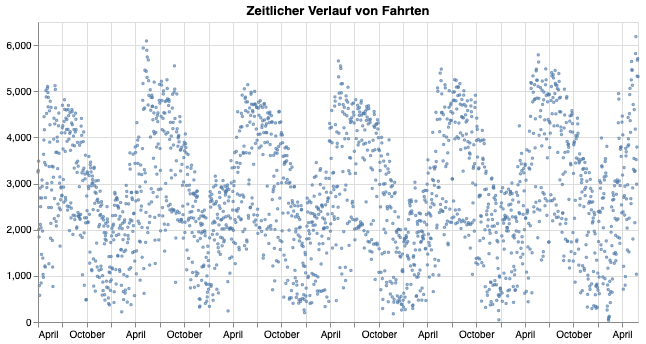

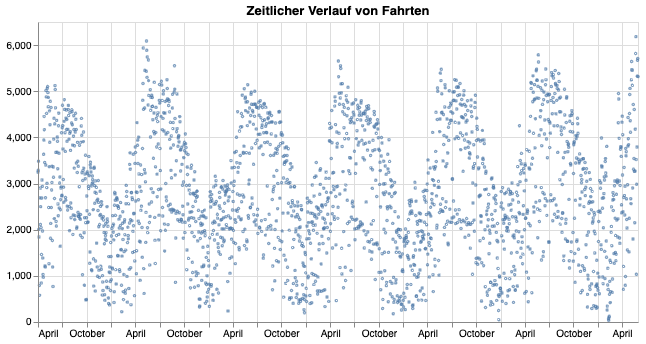

In [48]:
Grafik_Verlauf()

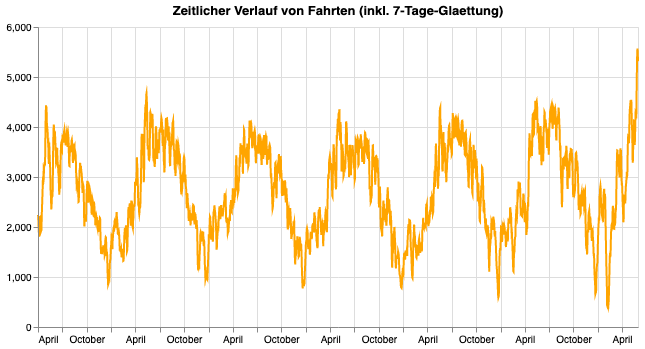

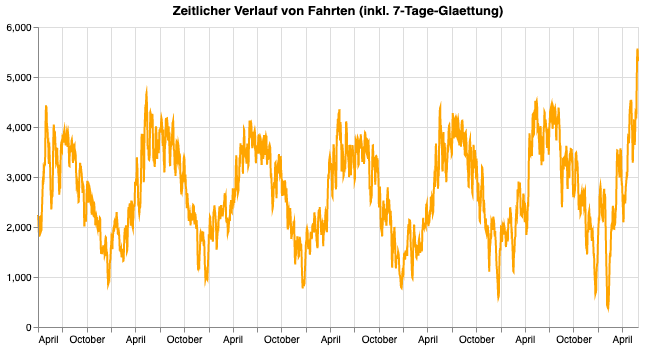

In [49]:
Grafik_Verlauf(Glaettungsfenster=7)

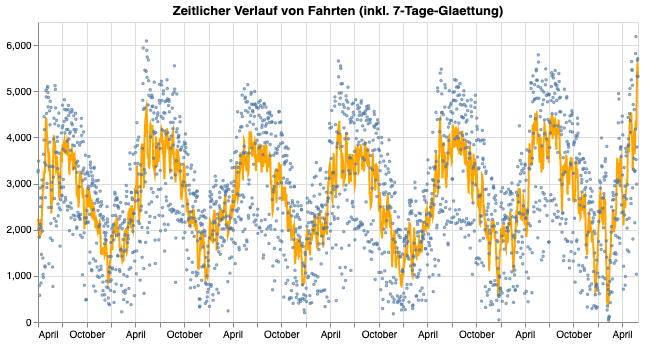

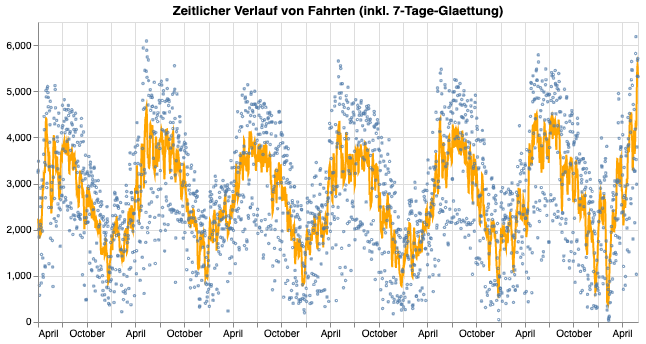

In [50]:
Grafik_Verlauf(Glaettungsfenster=7) + Grafik_Verlauf()

In [51]:
def Grafik_Streuung(Unabhaengige_Variable, 
                    Abhaengige_Variable='Fahrten',
                    DatenQuelle=DatenQuelle,
                    Auswahlfilter=None):
    
    Grafik_Streuung = alt.Chart(
        data=DatenQuelle,
        width=263, height=263
    ).mark_point(
        size=1
    ).encode(
        x=alt.X(Unabhaengige_Variable,
                scale=alt.Scale(zero=False)),
        y=alt.Y(Abhaengige_Variable,
                scale=alt.Scale(zero=False)),
        tooltip=list(DatenQuelle.columns)
    )
    
    if Auswahlfilter:
        
        Grafik_Streuung = Grafik_Streuung.encode(
            color=alt.condition(Auswahlfilter,
                                alt.ColorValue('#1f77b4'), alt.ColorValue('lightgrey'))
        ).add_selection(Auswahlfilter)
        
    Trendvariable = 'Trend_' + Abhaengige_Variable + '_iAv_' + Unabhaengige_Variable
    
    if Trendvariable in DatenQuelle.columns:
        
        Grafik_Trend = alt.Chart(
            data=DatenQuelle
        ).mark_line(
            color='red', size=2
        ).encode(
            x=alt.X(Unabhaengige_Variable),
            y=alt.Y(Trendvariable,
                    axis=alt.Axis(title=Abhaengige_Variable + ' (mit Trendlinie)'))
        )
        
        Grafik_Streuung = Grafik_Streuung + Grafik_Trend
    
    return Grafik_Streuung

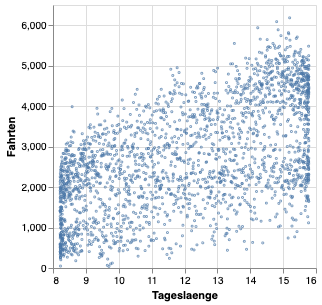

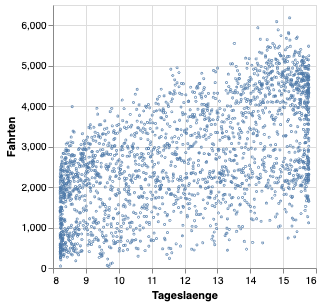

In [52]:
Grafik_Streuung('Tageslaenge')

In [53]:
def Grafik_Uebersicht(Abhaengige_Variable='Fahrten',
                      DatenQuelle=DatenQuelle):
    
    Auswahlfilter = alt.selection(type='interval', resolve='global')
    
    Oben = Grafik_Verlauf(Abhaengige_Variable=Abhaengige_Variable, 
                          DatenQuelle=DatenQuelle, 
                          Glaettungsfenster=7) \
         + Grafik_Verlauf(Abhaengige_Variable=Abhaengige_Variable,
                          DatenQuelle=DatenQuelle,
                          Auswahlfilter=Auswahlfilter)
    
    Links = Grafik_Streuung('Tageslaenge',
                            Abhaengige_Variable=Abhaengige_Variable, 
                            DatenQuelle=DatenQuelle,                            
                            Auswahlfilter=Auswahlfilter) \
          & Grafik_Streuung('ist_Werktag',
                            Abhaengige_Variable=Abhaengige_Variable, 
                            DatenQuelle=DatenQuelle,
                            Auswahlfilter=Auswahlfilter)
    
    Rechts = Grafik_Streuung('Temperatur',
                            Abhaengige_Variable=Abhaengige_Variable, 
                            DatenQuelle=DatenQuelle,
                            Auswahlfilter=Auswahlfilter) & \
             Grafik_Streuung('Niederschlag',
                            Abhaengige_Variable=Abhaengige_Variable, 
                            DatenQuelle=DatenQuelle,
                            Auswahlfilter=Auswahlfilter)
    
    Grafik_Uebersicht = Oben & (Links | Rechts)
    
    return Grafik_Uebersicht

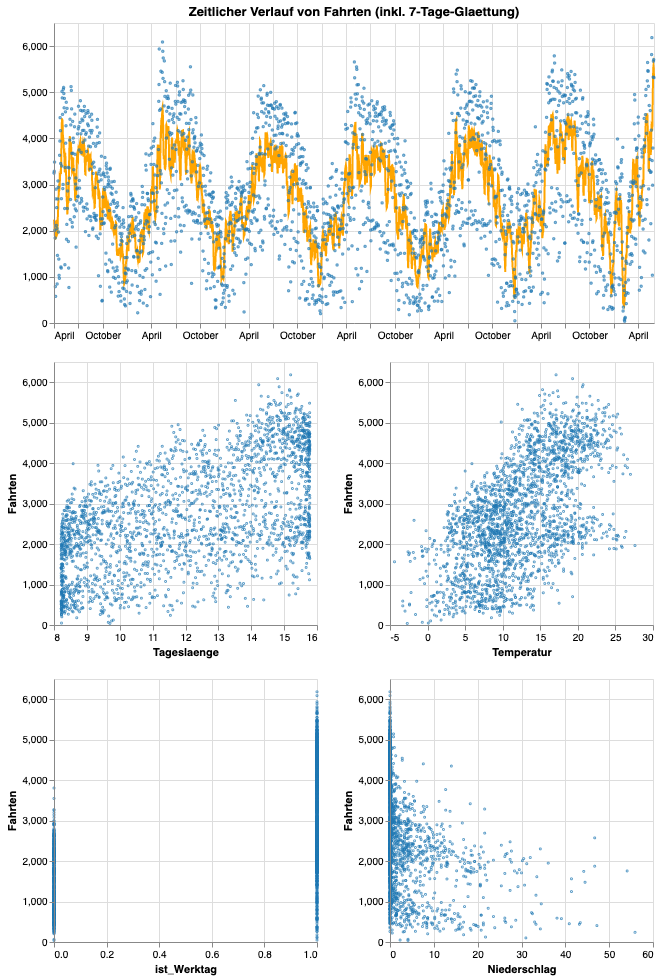

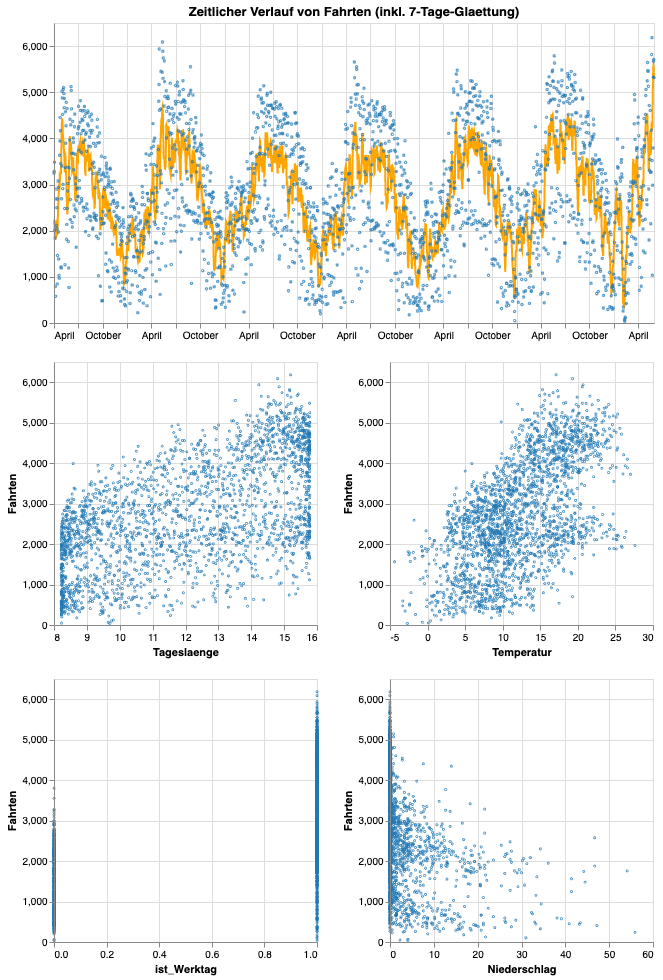

In [54]:
Grafik_Uebersicht()    

## Modellierung der Daten *(Modelling)*

### Lineare Regression - eine kurze Einführung

In [55]:
def LR_Modell_und_Daten(Liste_Unabhaengige_Regressionsvariablen,
                        Abhaengige_Regressionsvariable='Fahrten',
                        DatenQuelle=DatenQuelle):
    
    Daten_LR_Modell = DatenQuelle.copy()
    
    Daten_Unabhaengige_Regressionsvariablen = Daten_LR_Modell[Liste_Unabhaengige_Regressionsvariablen]
    Daten_Abhaengige_Regressionsvariable = Daten_LR_Modell[Abhaengige_Regressionsvariable]
    
    LR_Modell = LinearRegression(
    ).fit(Daten_Unabhaengige_Regressionsvariablen, 
          Daten_Abhaengige_Regressionsvariable)
    
    Daten_LR_Modell['Trend'] = LR_Modell.predict(Daten_Unabhaengige_Regressionsvariablen)
    
    Daten_LR_Modell[Abhaengige_Regressionsvariable+'_trendbereinigt']\
    = Daten_LR_Modell[Abhaengige_Regressionsvariable] \
    - Daten_LR_Modell['Trend'] \
    + Daten_LR_Modell['Trend'].mean()
    
    for Unabhaengige_Ceteris_Paribus_Regressionsvariable \
    in Liste_Unabhaengige_Regressionsvariablen:
        
        Ceteris_Paribus_Regressionsdatensatz = pd.DataFrame(index=Daten_LR_Modell.index)
        
        for Unabhaengige_Regressionsvariable in Liste_Unabhaengige_Regressionsvariablen:
            
            if Unabhaengige_Regressionsvariable == Unabhaengige_Ceteris_Paribus_Regressionsvariable:
                
                Ceteris_Paribus_Regressionsdatensatz[Unabhaengige_Ceteris_Paribus_Regressionsvariable] \
                = DatenQuelle[Unabhaengige_Ceteris_Paribus_Regressionsvariable]
                
            else:
                
                Ceteris_Paribus_Regressionsdatensatz[Unabhaengige_Regressionsvariable] \
                = DatenQuelle[Unabhaengige_Regressionsvariable].mean()
                
        Daten_LR_Modell['Trend_' + Abhaengige_Regressionsvariable \
                        + '_iAv_'+ Unabhaengige_Ceteris_Paribus_Regressionsvariable] \
        = LR_Modell.predict(Ceteris_Paribus_Regressionsdatensatz)
        
        Daten_LR_Modell['Trend_' + Abhaengige_Regressionsvariable + '_trendbereinigt'\
                        + '_iAv_'+ Unabhaengige_Ceteris_Paribus_Regressionsvariable] \
        = Daten_LR_Modell['Trend_' + Abhaengige_Regressionsvariable \
                        + '_iAv_'+ Unabhaengige_Ceteris_Paribus_Regressionsvariable].mean()
        
    
    return LR_Modell, Daten_LR_Modell

### Ein einfaches lineares Modell - Abhängigkeit der Fahrten von der Nummer des Tages

In [56]:
Liste_Unabhaengige_Regressionsvariablen = [
    'Tag',
]

LR_Modell, Daten_LR_Modell = LR_Modell_und_Daten(
    Liste_Unabhaengige_Regressionsvariablen=Liste_Unabhaengige_Regressionsvariablen,
    Abhaengige_Regressionsvariable='Fahrten',
    DatenQuelle=DatenQuelle)

In [57]:
Daten_LR_Modell

,Datum,Tag,Fahrten,Tageslaenge,ist_Werktag,Temperatur,Niederschlag,Trend,Fahrten_trendbereinigt,Trend_Fahrten_iAv_Tag,Trend_Fahrten_trendbereinigt_iAv_Tag
180,2013-04-01,180.0,3248.0,12.569347,1,12.8,0.0,2732.554542,3254.090505,2732.554542,2738.645047
181,2013-04-02,181.0,3287.0,12.627819,1,11.5,0.0,2732.559955,3293.085091,2732.559955,2738.645047
182,2013-04-03,182.0,3486.0,12.686201,1,11.7,0.0,2732.565369,3492.079678,2732.565369,2738.645047
183,2013-04-04,183.0,2007.0,12.744485,1,12.0,8.4,2732.570783,2013.074264,2732.570783,2738.645047
184,2013-04-05,184.0,1842.0,12.802661,1,12.2,18.5,2732.576197,1848.068850,2732.576197,2738.645047
185,2013-04-06,185.0,789.0,12.860720,0,9.8,12.7,2732.581610,795.063436,2732.581610,2738.645047
186,2013-04-07,186.0,577.0,12.918653,0,7.2,39.1,2732.587024,583.058023,2732.587024,2738.645047
187,2013-04-08,187.0,2689.0,12.976449,1,7.7,0.8,2732.592438,2695.052609,2732.592438,2738.645047
188,2013-04-09,188.0,2900.0,13.034098,1,9.1,0.0,2732.597852,2906.047195,2732.597852,2738.645047
189,2013-04-10,189.0,2113.0,13.091591,1,11.7,9.4,2732.603265,2119.041781,2732.603265,2738.645047


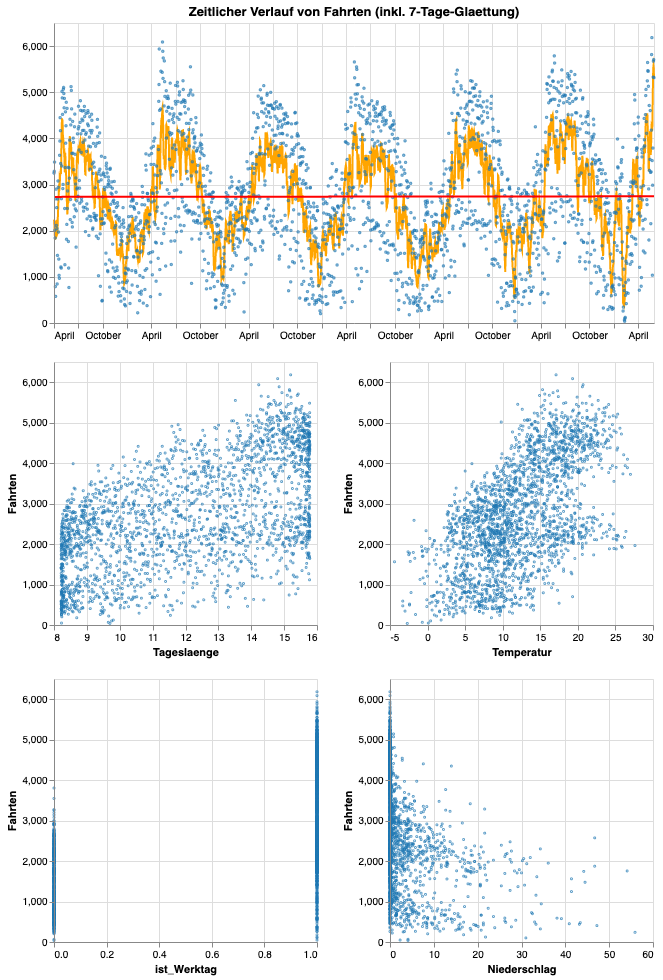

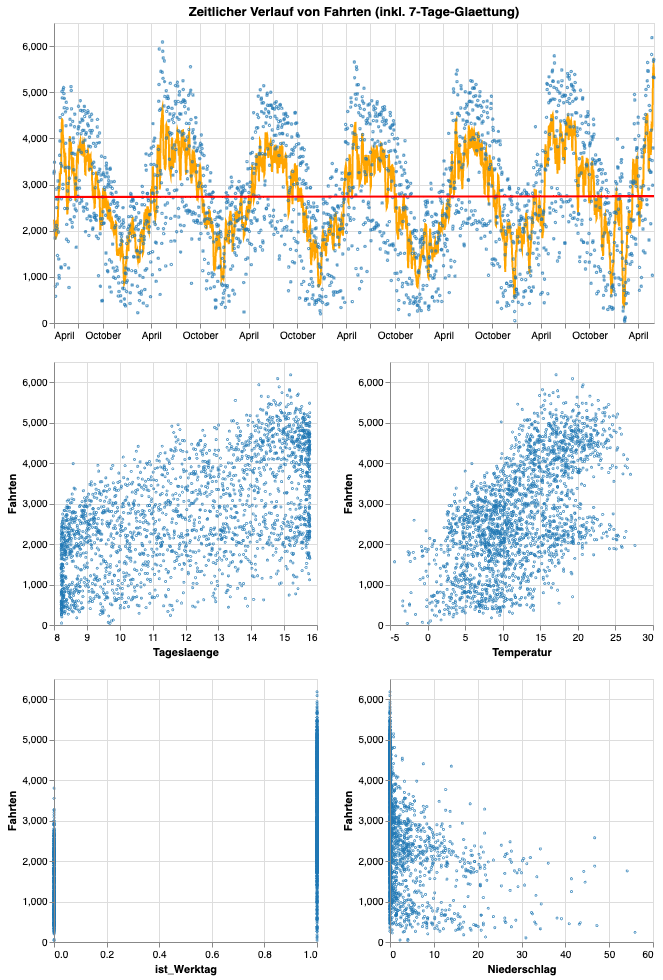

In [58]:
Grafik_Uebersicht(Abhaengige_Variable='Fahrten', 
                  DatenQuelle=Daten_LR_Modell)

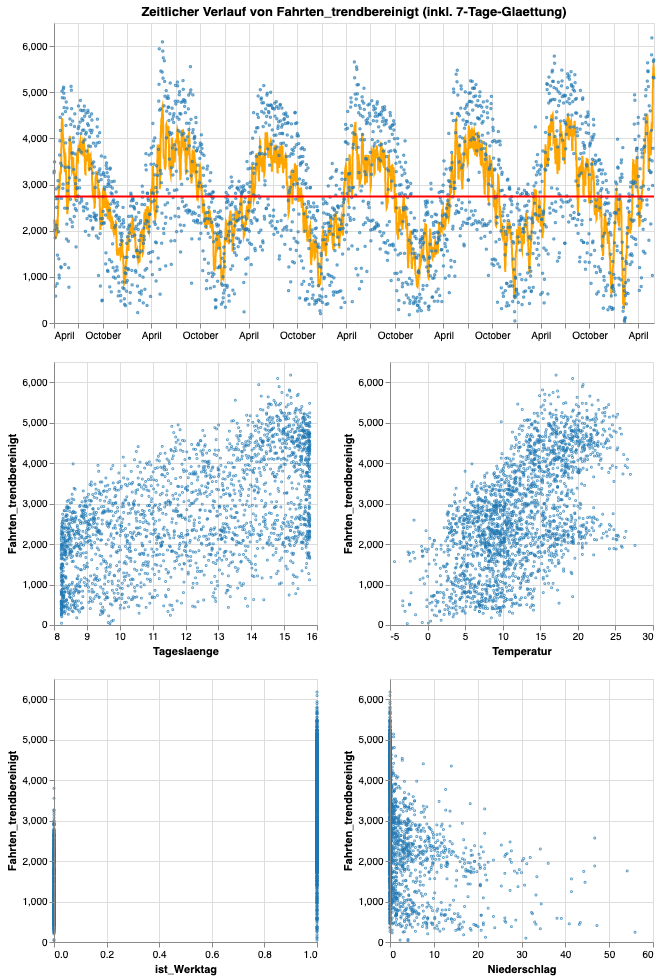

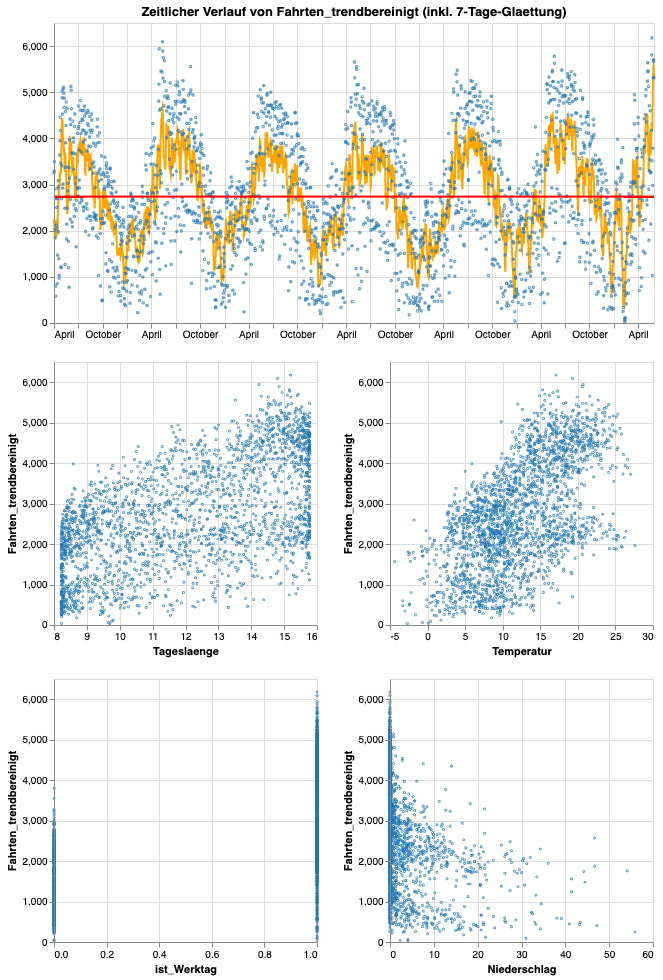

In [59]:
Grafik_Uebersicht(Abhaengige_Variable='Fahrten_trendbereinigt', 
                  DatenQuelle=Daten_LR_Modell)

In [60]:
def Statistik(Liste_Unabhaengige_Regressionsvariablen=Liste_Unabhaengige_Regressionsvariablen,
              Abhaengige_Regressionsvariable='Fahrten', 
              Daten_LR_Modell=Daten_LR_Modell, 
              LR_Modell=LR_Modell):
    
    Steigung = LR_Modell.coef_
    
    y = Daten_LR_Modell[Abhaengige_Regressionsvariable]
    y_trend = Daten_LR_Modell['Trend']
    X = Daten_LR_Modell[Liste_Unabhaengige_Regressionsvariablen]
    
    var_y = np.sum((y - y_trend) ** 2) / len(y)
    X2 = np.hstack([X, np.ones((X.shape[0], 1))])
    C = var_y * np.linalg.inv(np.dot(X2.T, X2))
    var = C.diagonal()
    
    Fehler = np.sqrt(var[:])
    
    for Zaehler, Unabhaengige_Regressionsvariable \
    in enumerate(Liste_Unabhaengige_Regressionsvariablen):
        
        print('{0:.2f} +/- {1:.2f}'.format(Steigung[Zaehler], Fehler[Zaehler]), 
              Abhaengige_Regressionsvariable, 
              'je Einheit', 
              Unabhaengige_Regressionsvariable)
              
    return None

In [61]:
Statistik(Liste_Unabhaengige_Regressionsvariablen=Liste_Unabhaengige_Regressionsvariablen, 
          Abhaengige_Regressionsvariable='Fahrten', 
          Daten_LR_Modell=Daten_LR_Modell, 
          LR_Modell=LR_Modell)

0.01 +/- 0.04 Fahrten je Einheit Tag


In [62]:
def Lineare_Regressionsanalyse(
    Liste_Unabhaengige_Regressionsvariablen=Liste_Unabhaengige_Regressionsvariablen,
    Abhaengige_Regressionsvariable='Fahrten',
    DatenQuelle=DatenQuelle):
    
    LR_Modell, Daten_LR_Modell = LR_Modell_und_Daten(
        Liste_Unabhaengige_Regressionsvariablen=Liste_Unabhaengige_Regressionsvariablen,
        Abhaengige_Regressionsvariable=Abhaengige_Regressionsvariable,
        DatenQuelle=DatenQuelle)
    
    Grafik_Uebersicht_normal = \
    Grafik_Uebersicht(Abhaengige_Variable=Abhaengige_Regressionsvariable, 
                      DatenQuelle=Daten_LR_Modell)
    
    Grafik_Uebersicht_trendbereinigt = \
    Grafik_Uebersicht(Abhaengige_Variable=Abhaengige_Regressionsvariable + '_trendbereinigt', 
                      DatenQuelle=Daten_LR_Modell)
    
    Statistik(Liste_Unabhaengige_Regressionsvariablen=Liste_Unabhaengige_Regressionsvariablen,
              Abhaengige_Regressionsvariable=Abhaengige_Regressionsvariable, 
              Daten_LR_Modell=Daten_LR_Modell, LR_Modell=LR_Modell)
    
    return Grafik_Uebersicht_normal & Grafik_Uebersicht_trendbereinigt

In [68]:
Lineare_Regressionsanalyse([''])

ValueError: Found array with 0 feature(s) (shape=(2251, 0)) while a minimum of 1 is required.

### *Do-It-Yourself: Abhängigkeit der Fahrten von der Temperatur*

131.11 +/- 3.83 Fahrten je Einheit Temperatur


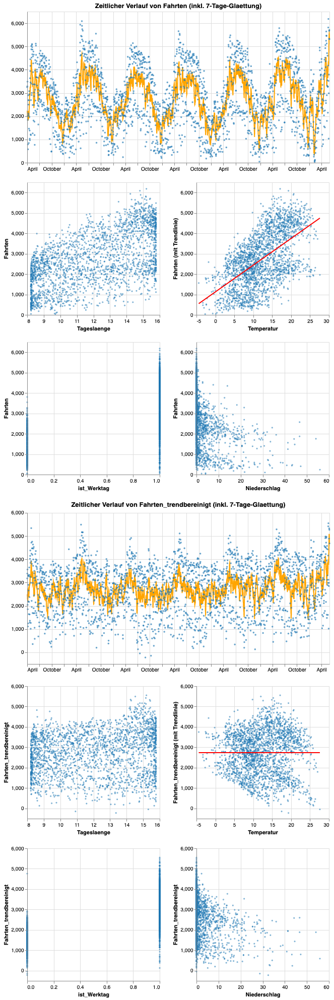

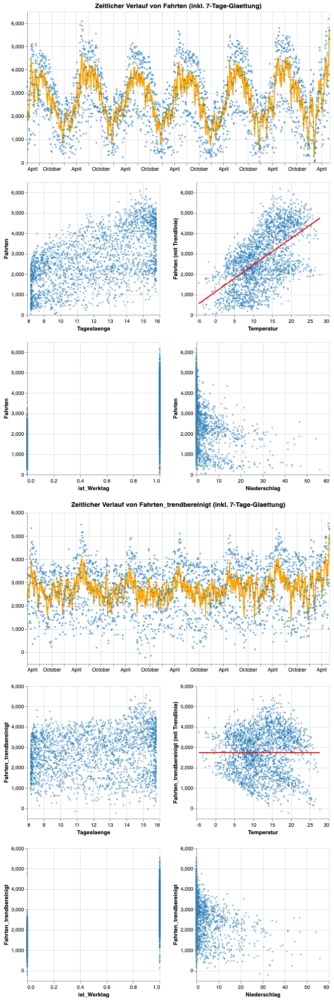

In [64]:
Lineare_Regressionsanalyse(['Temperatur'])

### Ein multi-lineares Modell - Abhängigkeit der Fahrten von Tageslänge und ist_Werktag

295.59 +/- 5.99 Fahrten je Einheit Tageslaenge
1748.69 +/- 34.48 Fahrten je Einheit ist_Werktag


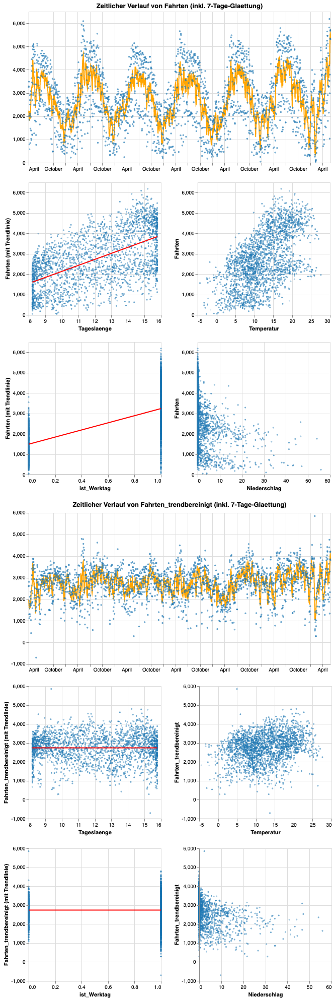

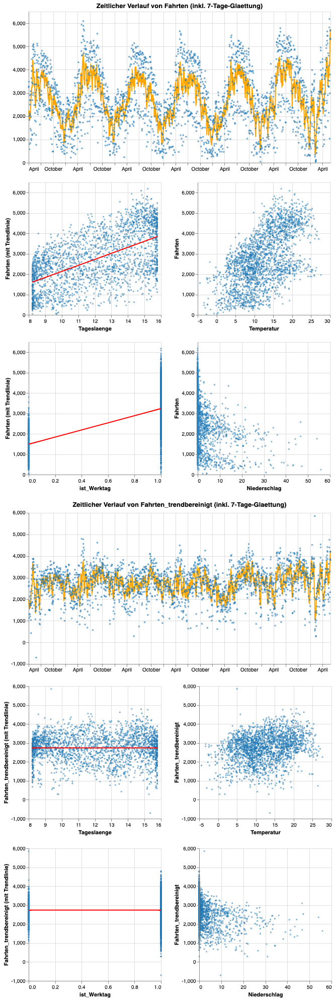

In [65]:
Lineare_Regressionsanalyse(['Tageslaenge', 'ist_Werktag'])

### *Do-It-Yourself: Abhängigkeit der Fahrten von Temperatur und Niederschlag*

### Das vollständige multi-lineare Modell

135.12 +/- 7.70 Fahrten je Einheit Tageslaenge
1730.96 +/- 28.60 Fahrten je Einheit ist_Werktag
76.11 +/- 3.32 Fahrten je Einheit Temperatur
-46.16 +/- 2.03 Fahrten je Einheit Niederschlag


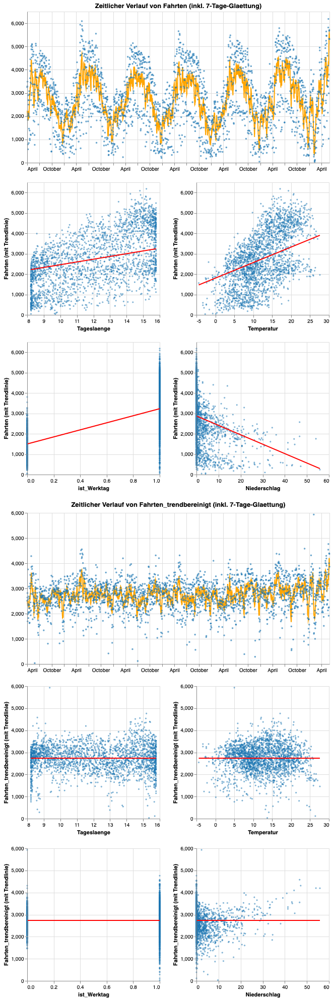

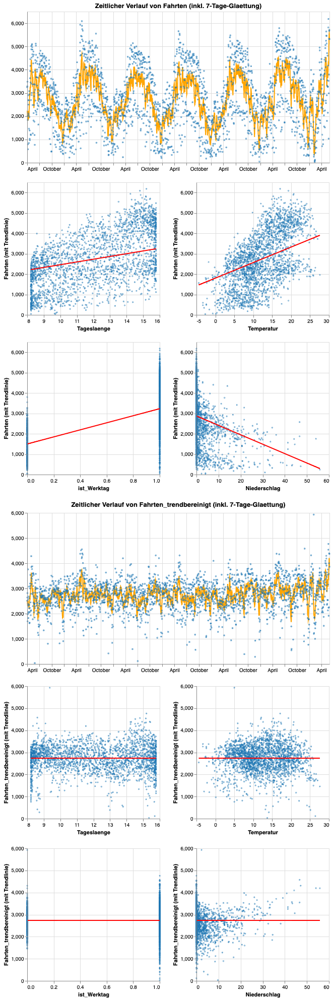

In [66]:
Lineare_Regressionsanalyse(['Tageslaenge', 'ist_Werktag', 'Temperatur', 'Niederschlag'])

135.57 +/- 7.63 Fahrten je Einheit Tageslaenge
1730.98 +/- 28.35 Fahrten je Einheit ist_Werktag
77.51 +/- 3.30 Fahrten je Einheit Temperatur
-45.77 +/- 2.02 Fahrten je Einheit Niederschlag
0.12 +/- 0.02 Fahrten je Einheit Tag


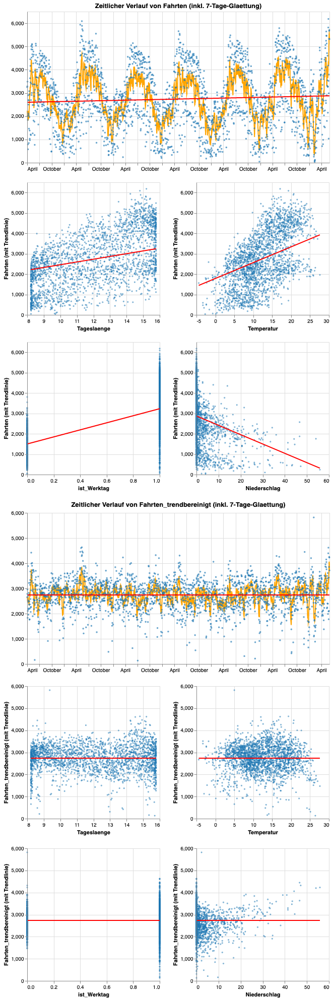

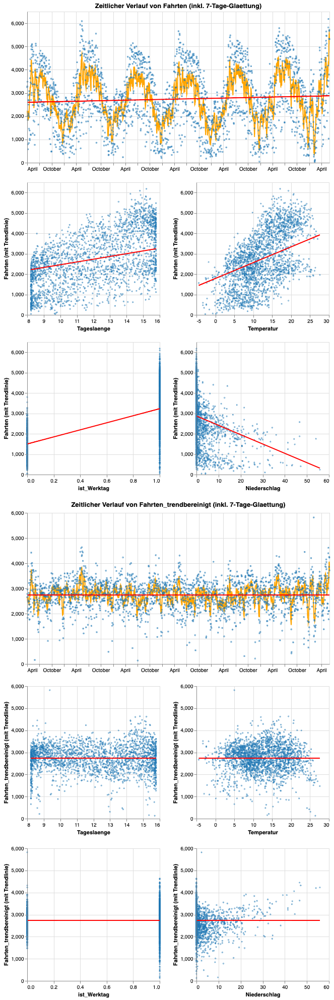

In [67]:
Lineare_Regressionsanalyse(['Tageslaenge', 'ist_Werktag', 'Temperatur', 'Niederschlag', 'Tag'])

## Ergebnisse